# GRAPHS

In [1]:
from graph_tool.all import sfdp_layout,graph_draw
import graph_tool as gt 
import geopandas as gpd
import networkx as nx
import momepy
import os
import time
import numpy as np
import matplotlib.pyplot as plt
mother_dir = os.chdir('..')



def graph_from_geojson(filename,node_col_front,node_col_tail,edge_col,prop_edge_col):
    '''
        Input:
            filename: string -> name.geojson
            name of node column front: string
            name of node column tail: string
            name of edge column
            name of property column
        Output:
            graph-tool graph
    '''
    gdf = gpd.read_file(filename)
    G = Graph()
    G.add_edge_list(gdf[[node_col_front,node_col_tail]].values)
    v_number_people_prop = G.new_vertex_property('int')
    G.vp['number_people'] = v_number_people_prop
    id_prop = G.new_edge_property('int')
    G.ep['id'] = id_prop
    length_prop = G.new_edge_property('float')
    G.ep['length'] = length_prop
    for v,uv in G.items():
        uv['id'] = gdf[gdf[node_col_front] == e.source()][gdf[node_col_tail] == e.target()][edge_col].values[0]
        uv['length'] = gdf[gdf[node_col_front] == e.source()][gdf[node_col_tail] == e.target()][prop_edge_col].values[0]
        v['number_people'] = np.random(1)
    return G

def _generate_uniform_distribution_nodes_in_space(number_nodes = 100, radius_city = 10,p = 0.7):  
    '''
        Generate a uniform distribution of points in a circle of radius radius_city
        Initialize postiions and distance matrix
    '''  
    from scipy.spatial import distance_matrix
    G = gt.Graph()
    nodes_r = np.random.random(number_nodes)
    nodes_costeta = 2*np.random.random(number_nodes) - 1      
    x = nodes_r*(radius_city)*nodes_costeta
    y = nodes_r*(radius_city)*np.sqrt(1-nodes_costeta**2)  
    points_in_space = np.array([x,y]).T 
    position_vertex = G.new_vertex_property('vector<double>')
    id_vertex = G.new_vertex_property('int')
    print('initializing id vertex')
    for i in range(len(x)):
        G.add_vertex()
        id_vertex[G.vertex(i)] = i
    print('initializing position vertex')
    for node_position in range(len(points_in_space)):
        position_vertex[G.vertex(node_position)] = points_in_space[node_position] 
    G.vp['position'] = position_vertex
    G.vp['id'] = id_vertex
    for i in range(number_nodes):
        for j in range(number_nodes):
            if j !=i:
                if p < np.random.rand():
                    G.add_edge(i,j)
    print('calculating distance matrix')
    distance_matrix_ = distance_matrix(points_in_space,points_in_space)
    unweighted_edge = G.new_edge_property('int')
    length_edge = G.new_edge_property('float')
    print('initializing edge properties')
    for edge in G.edges():
        length_edge[edge] = distance_matrix_[int(edge.source())][int(edge.target())]
        unweighted_edge[edge] = 1
    G.ep['length'] = length_edge
    G.ep['unweighted'] = unweighted_edge
    return G

def distribution_edges(g):
    '''
        Citation: The spatial structure of networks: Michael T. Gastner and M. E. J. Newman
        Figure (1)
    '''
#    A = gt.spectral.adjacency(g)
#    print(A.getnnz())
#    list_degrees = []
#    for i in range(len(A)):
#        list_degrees.append(np.sum(A[i]))
    gt.stats.edge_hist(g,deg='unweighted')
    n,bins = np.histogram(list_degrees)
    
    plt.plot(bins[:-1],n)
    plt.xlabel('Degree')
    plt.ylabel('Number of nodes')
    plt.show()

def dimension_graph(g):
    '''
        Citation: The spatial structure of networks: Michael T. Gastner and M. E. J. Newman
        Figure (2)
    '''
    
    dist_ = gt.topology.shortest_distance(g)
    diameter_ = _get_diameter_graph(dist,g)
    number_vertices = len(g.vp['id'].get_array())
    list_N_vr = np.zeros((len(g.vp['id'].get_array()),diameter_+1))
    list_r = np.arange(diameter_+1)
    for r in range(diameter_+1):
        print('r: ',r)
        for vertex in g.vertices():
            pos = np.where(dist_[vertex].a == r)
            print('pos:\n',pos)
            Nv_r = len(pos)
            list_N_vr[g.vp['id'][vertex]][r] = Nv_r
    Avg_Nv_r = np.sum(list_N_vr,axis=0)/len(g.vp['id'].get_array())
    print('avg Nv',np.shape(Avg_Nv_r),' ',Avg_Nv_r)
    print('r',np.shape(list_r),' ',list_r)
    fig,ax = plt.subplots(1,1,figsize=(12,6))
    ax.plot(list_r,Avg_Nv_r)
    ax.set_xlabel('r')
    ax.set_ylabel('$\langle N_v(r) \rangle$')
    ax.set_xscale('log')
    ax.set_yscale('log')
    plt.show()

def _get_diameter_graph(dist,g):
    '''
        Given a graph-tool graph, and already computed shortest distance ,return the diameter of the graph
    '''
    diameter_ = 0
    for vertex in g.vertices():
        for vertex_ in g.vertices():
            if dist[vertex].a[G.vp['id'][vertex_]] > diameter_:
                diameter_ = dist[vertex].a[G.vp['id'][vertex_]]
    print('diameter: ',diameter_)
    return diameter_


/home/aamad/anaconda3/envs/gt/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
print(mother_dir)
G = _generate_uniform_distribution_nodes_in_space()
print('fraction of complete graph',G.num_edges()/(G.num_vertices()*(G.num_vertices()-1)))
#pos = sfdp_layout(G)
#graph_draw(G,pos = pos,cooling_step = 1.01,epsilon = 1)
dimension_graph(G)
dist = gt.topology.shortest_distance(G)
print(dist[0].get_array())
distribution_edges(G)


None
initializing id vertex
initializing position vertex
calculating distance matrix
initializing edge properties
fraction of complete graph 0.3021212121212121


NameError: name 'dist' is not defined

In [29]:
import scipy.spatial as sp
np.where(G.ep['length'].a == np.max(G.ep['length'].a))[0][0]


1859

In [15]:
dir_ = '/home/aamad/Desktop/phd/codice/city-pro'

t0 = time.time()
#bolo = gpd.read_file(os.path.join(dir_,"bologna-provincia.geojson"))
t1 = time.time()
#print('attributes geopandas:', bolo)
print('Time elapsed reading gpd:', t1-t0)
print('Time elapsed creation nx from gpd:', t1-t0)
t0 = time.time()
G = graph_from_geojson(os.path.join(dir_,"bologna-provincia.geojson"),'poly_nF','poly_nT','poly_cid','poly_length')
t1 = time.time()
print('Time elapsed creation gt from nx:', t1-t0)
print('graph-tool dict:`n',G.__dict__)


Time elapsed reading gpd: 2.1696090698242188e-05
Time elapsed creation nx from gpd: 2.1696090698242188e-05


AttributeError: 'Graph' object has no attribute 'items'

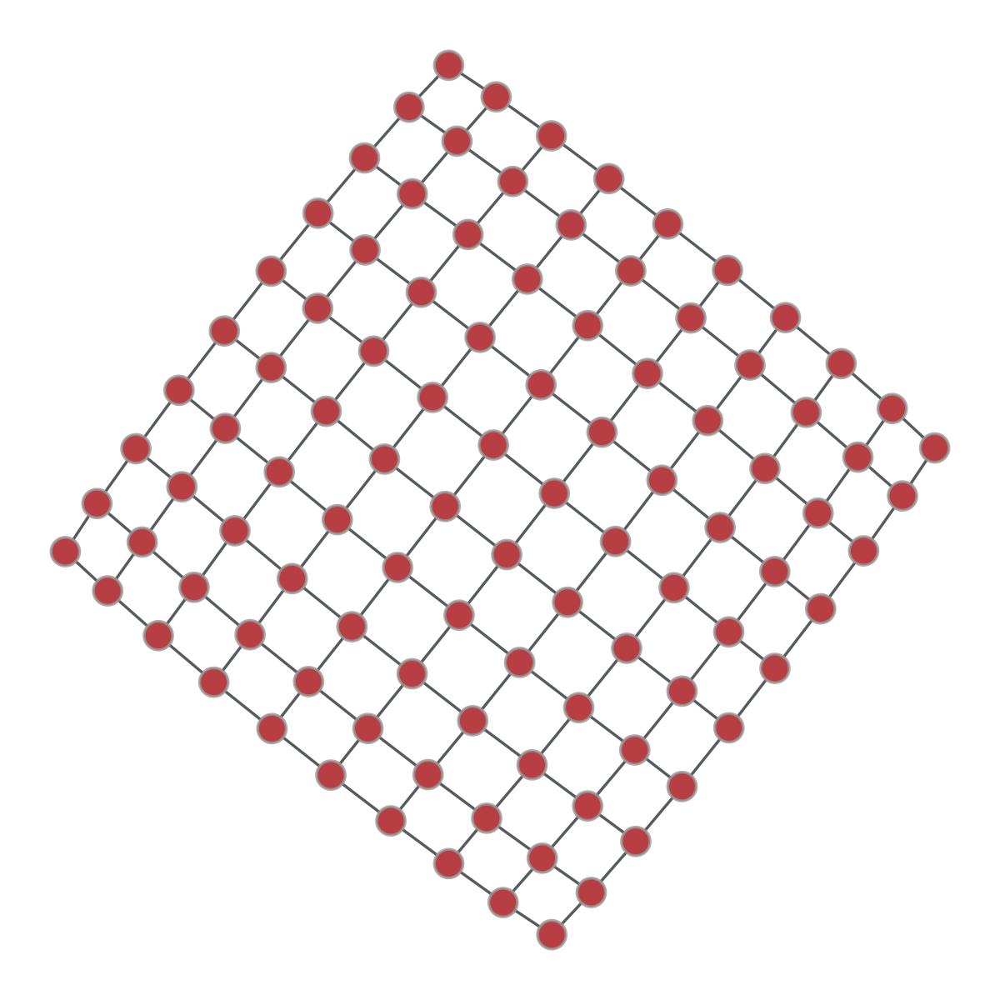

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fe3b00f9c10, at 0x7fe3af1dcf90>

In [7]:
from graph_tool.all import * 
import numpy as np
G = lattice([10,10])
time_spent = G.new_edge_property('float')
G.ep['time_spent'] = time_spent
for i in range(100):
    G.ep['time_spent'][G.edges()[i]] = np.random(1)
pos = sfdp_layout(G)
graph_draw(G,pos = pos,cooling_step = 1.01,epsilon = 1)

In [10]:
import sys 
import os
os.__dict__

{'__name__': 'os',
 '__doc__': "OS routines for NT or Posix depending on what system we're on.\n\nThis exports:\n  - all functions from posix or nt, e.g. unlink, stat, etc.\n  - os.path is either posixpath or ntpath\n  - os.name is either 'posix' or 'nt'\n  - os.curdir is a string representing the current directory (always '.')\n  - os.pardir is a string representing the parent directory (always '..')\n  - os.sep is the (or a most common) pathname separator ('/' or '\\\\')\n  - os.extsep is the extension separator (always '.')\n  - os.altsep is the alternate pathname separator (None or '/')\n  - os.pathsep is the component separator used in $PATH etc\n  - os.linesep is the line separator in text files ('\\r' or '\\n' or '\\r\\n')\n  - os.defpath is the default search path for executables\n  - os.devnull is the file path of the null device ('/dev/null', etc.)\n\nPrograms that import and use 'os' stand a better chance of being\nportable between different platforms.  Of course, they must 

In [27]:
os.environ.keys()

KeysView(environ({'BAMF_DESKTOP_FILE_HINT': '/var/lib/snapd/desktop/applications/code_code.desktop', 'CHROME_DESKTOP': 'code-url-handler.desktop', 'CONDA_DEFAULT_ENV': 'gt', 'CONDA_EXE': '/home/aamad/anaconda3/bin/conda', 'CONDA_PREFIX': '/home/aamad/anaconda3/envs/gt', 'CONDA_PROMPT_MODIFIER': '(gt) ', 'CONDA_PYTHON_EXE': '/home/aamad/anaconda3/bin/python', 'CONDA_SHLVL': '2', 'DBUS_SESSION_BUS_ADDRESS': 'unix:path=/run/user/1000/bus', 'DESKTOP_SESSION': 'ubuntu', 'DISPLAY': 'localhost:0.0', 'ELECTRON_NO_ATTACH_CONSOLE': '1', 'GDK_BACKEND': 'x11', 'GDK_PIXBUF_MODULEDIR': '/snap/code/143/usr/lib/x86_64-linux-gnu/gdk-pixbuf-2.0/2.10.0/loaders', 'GDK_PIXBUF_MODULE_FILE': '/home/aamad/snap/code/common/.cache/gdk-pixbuf-loaders.cache', 'GDMSESSION': 'ubuntu', 'GIO_LAUNCHED_DESKTOP_FILE': '/var/lib/snapd/desktop/applications/code_code.desktop', 'GIO_LAUNCHED_DESKTOP_FILE_PID': '5155', 'GIO_MODULE_DIR': '/home/aamad/snap/code/common/.cache/gio-modules', 'GJS_DEBUG_OUTPUT': 'stderr', 'GJS_DEB

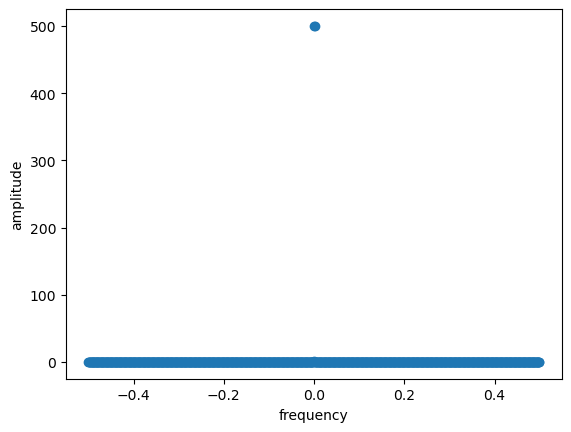

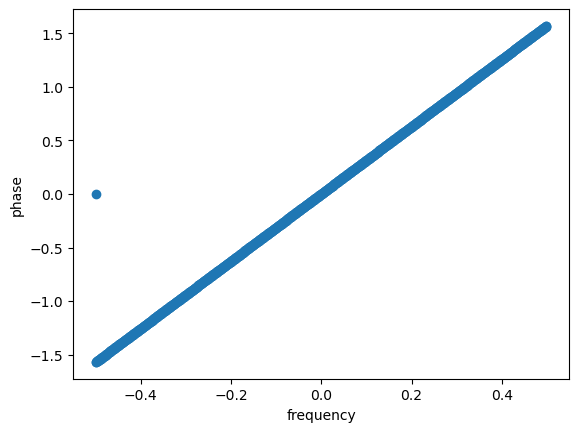

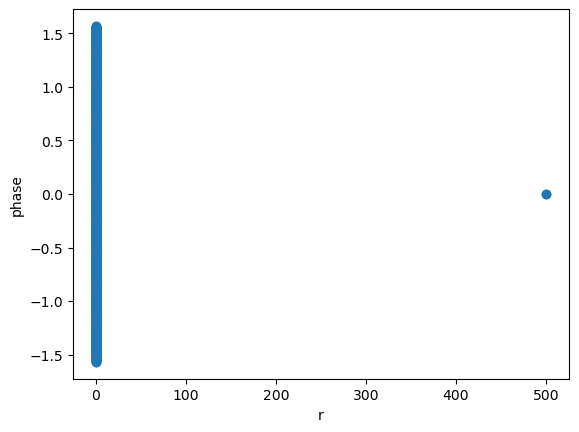

In [7]:
import numpy as np
import matplotlib.pyplot as plt
x = np.linspace(0,2*np.pi,1000)
cosx = np.cos(x)
fft_ = np.fft.fft(cosx)
freq = np.fft.fftfreq(len(x))
r = np.sqrt(fft_.real**2 + fft_.imag**2)
theta = np.arctan(fft_.imag/fft_.real)
plt.scatter(freq,r)
plt.xlabel('frequency')
plt.ylabel('amplitude')
plt.show()
plt.scatter(freq,theta)    
plt.xlabel('frequency')
plt.ylabel('phase')
plt.show()
plt.scatter(r,theta)    
plt.xlabel('r')
plt.ylabel('phase')
plt.show()


KeyboardInterrupt: 

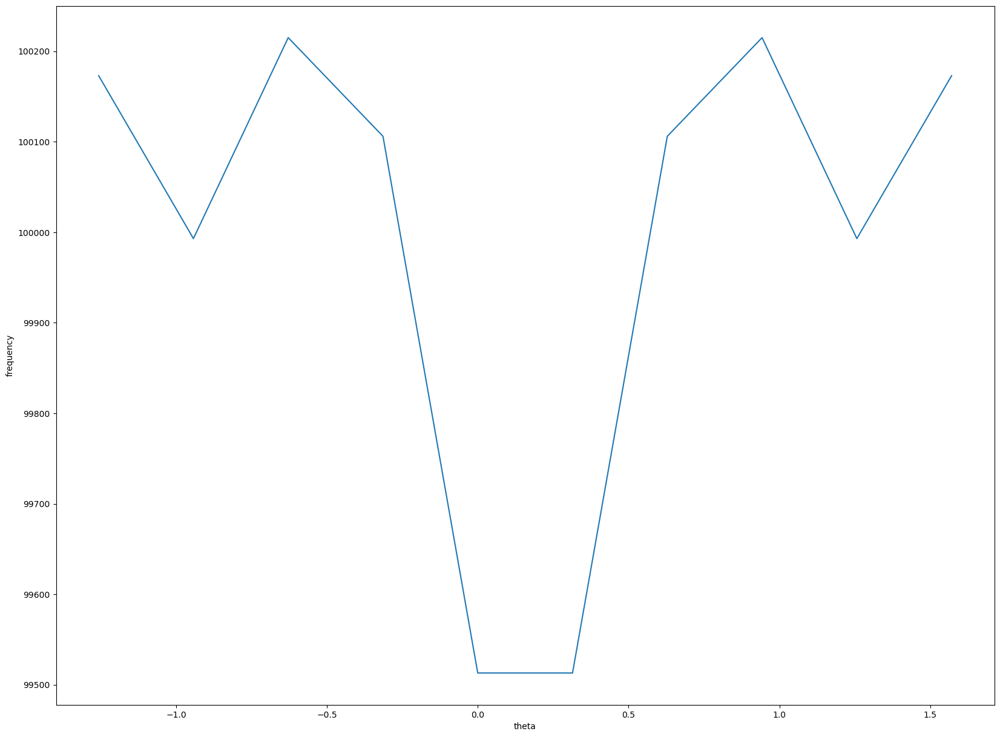

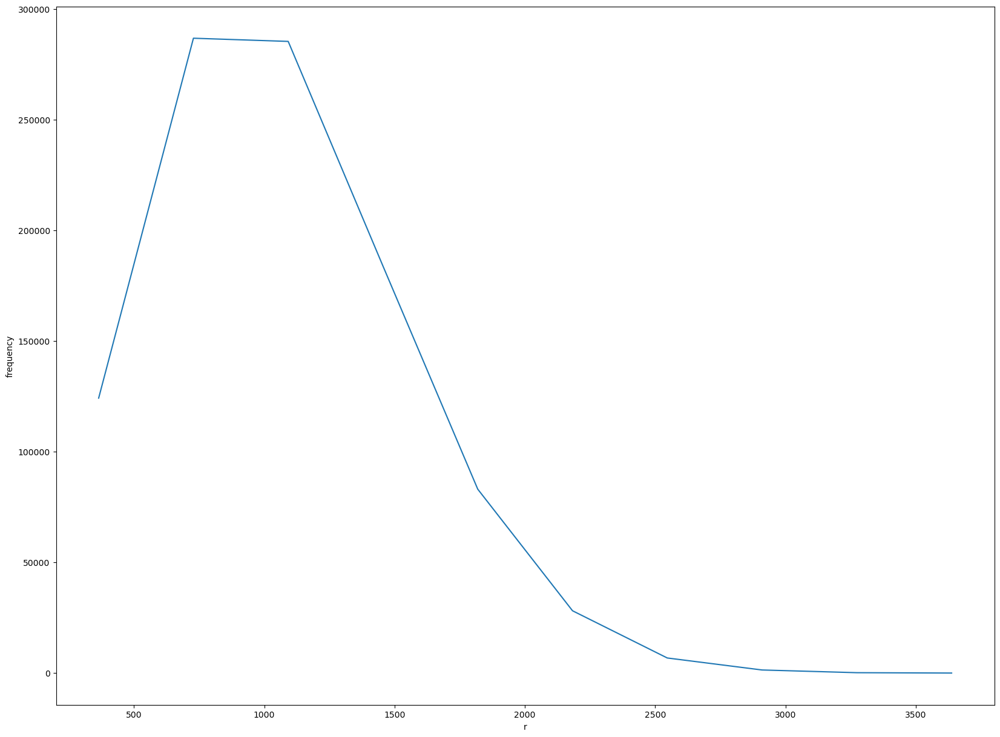

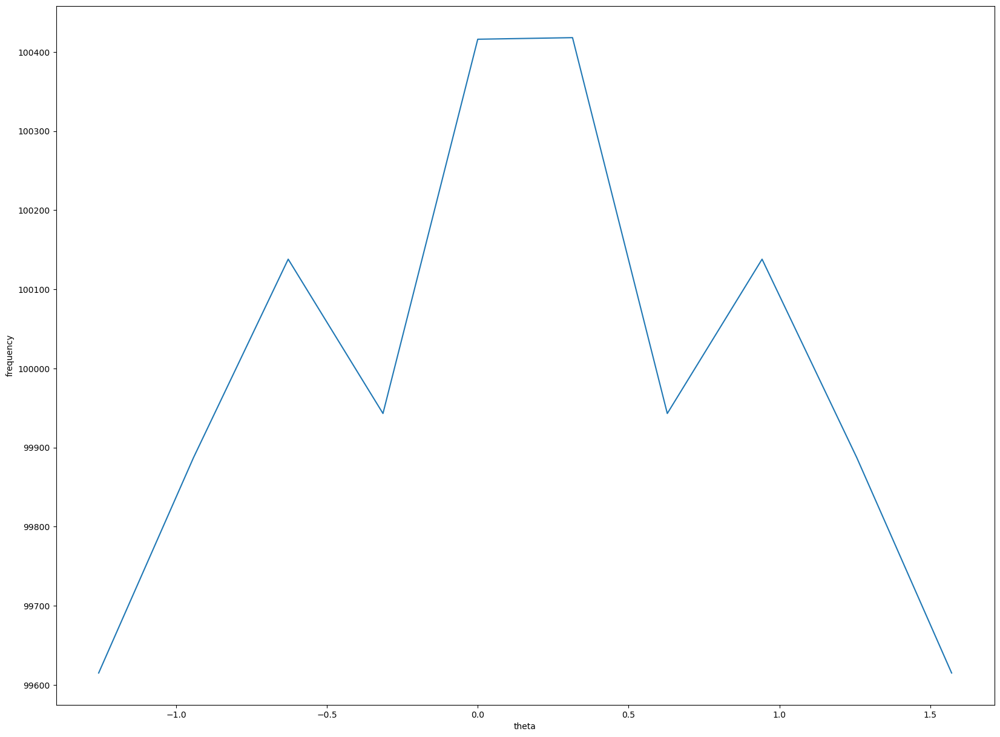

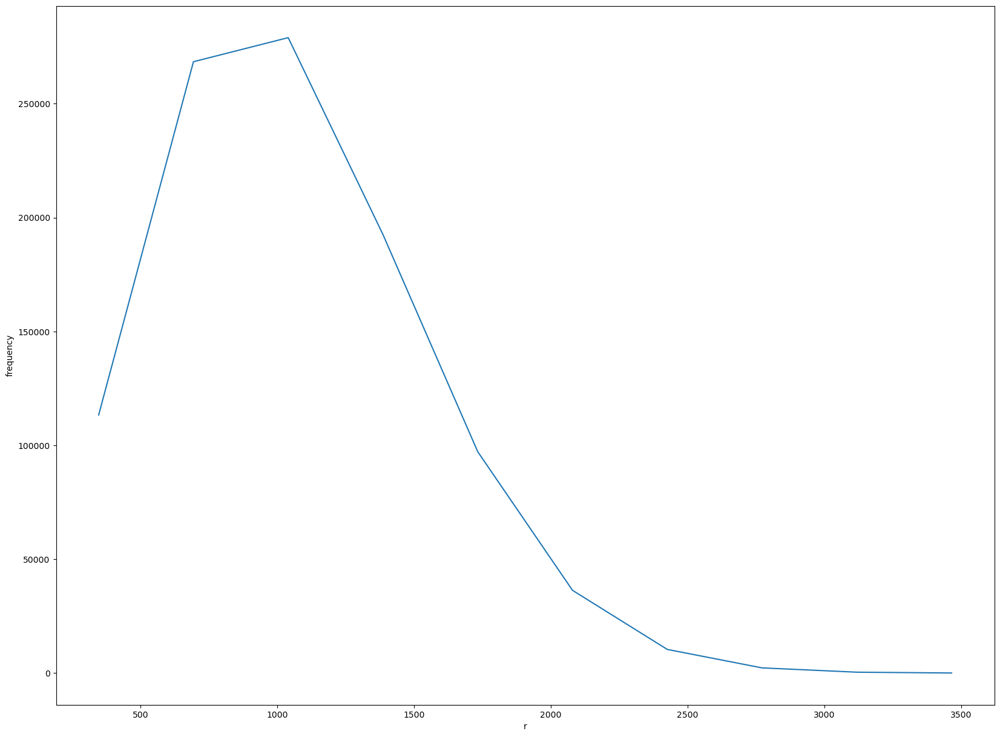

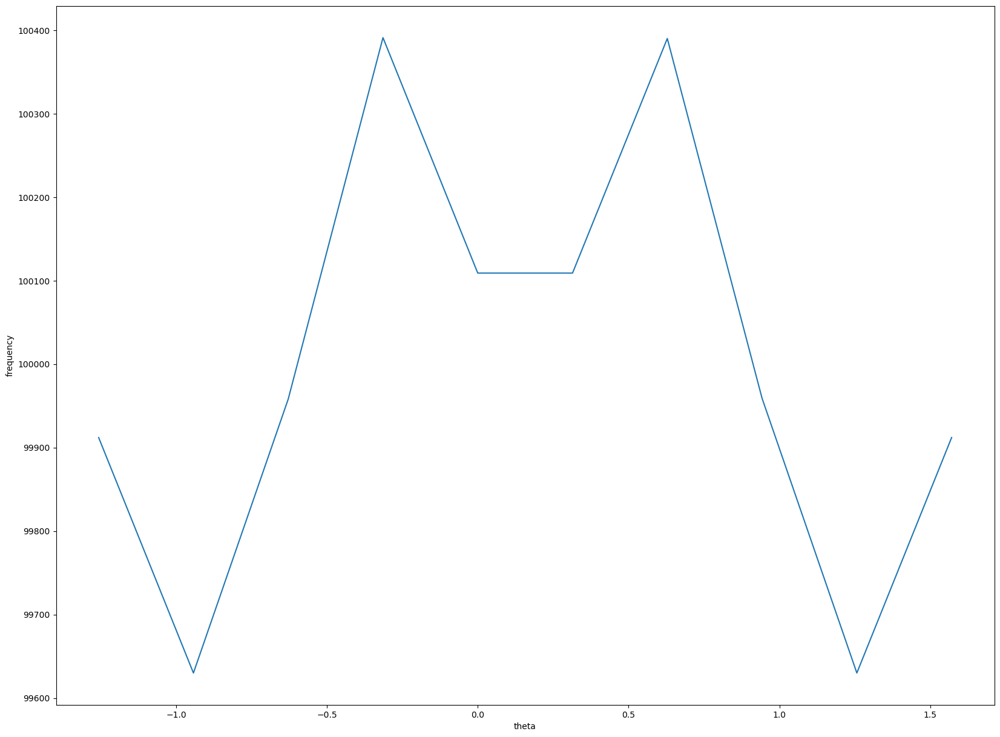

...

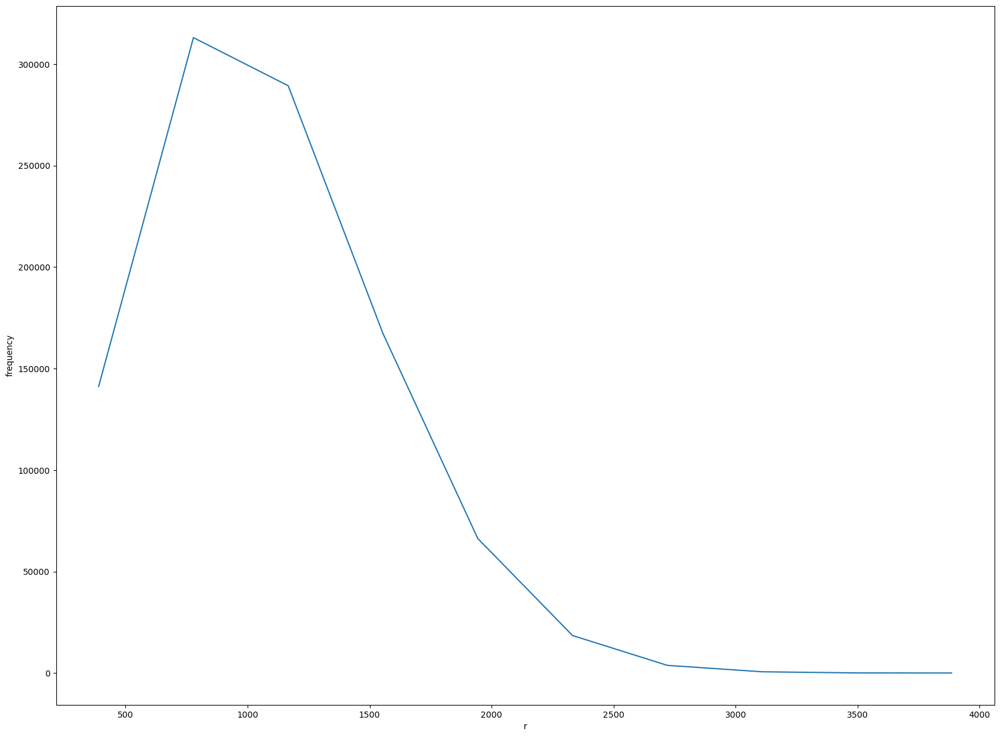

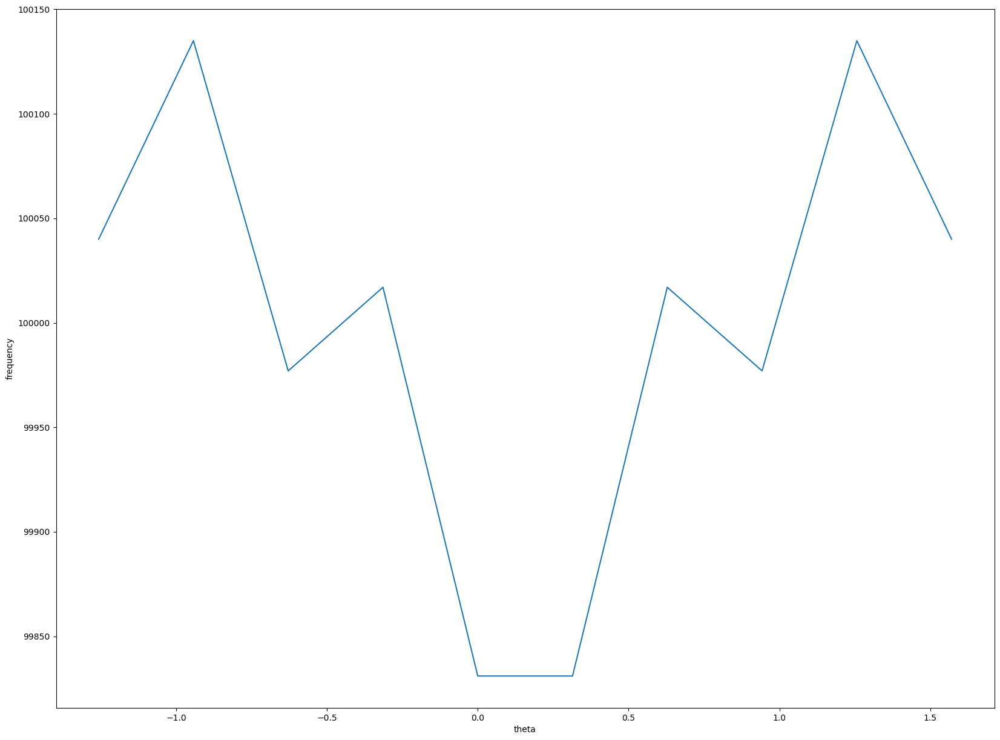

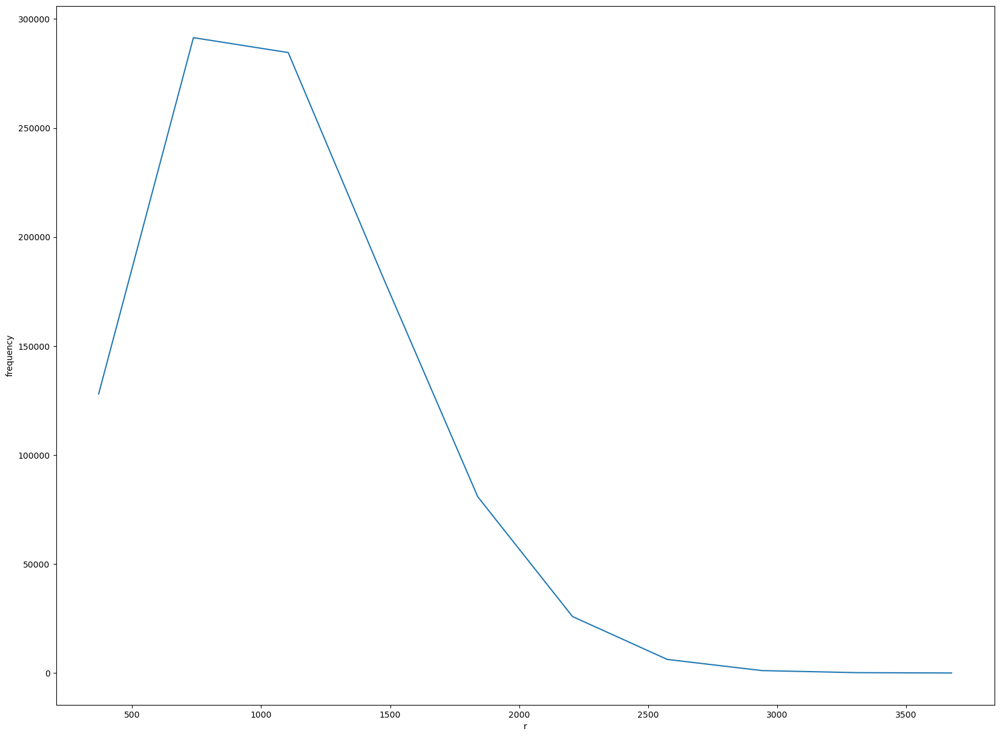

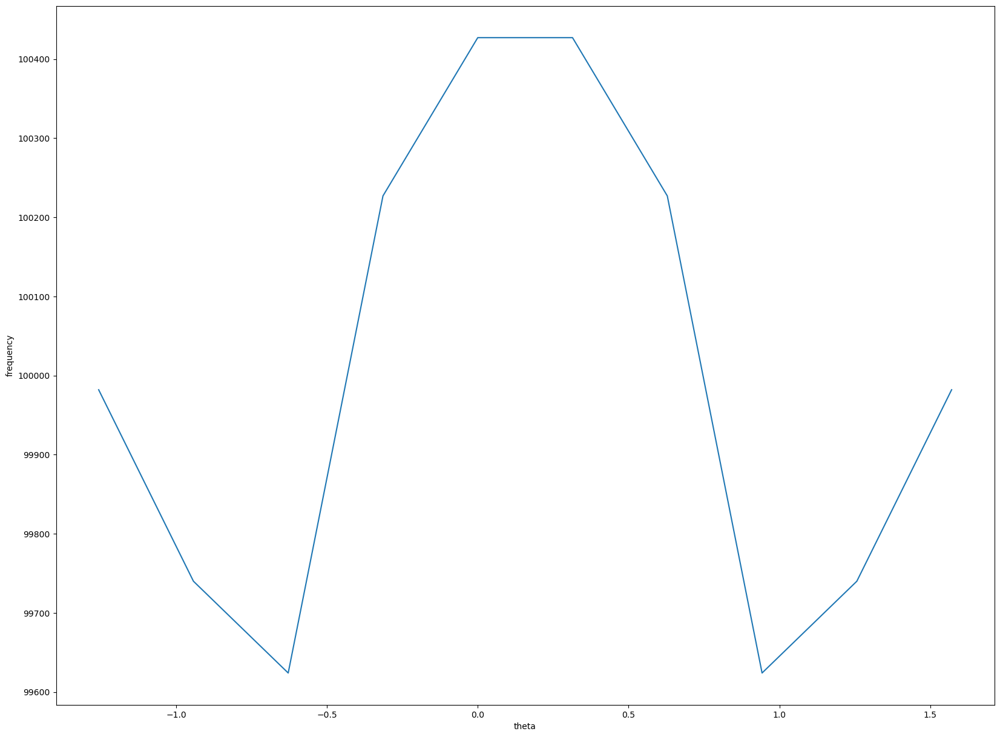

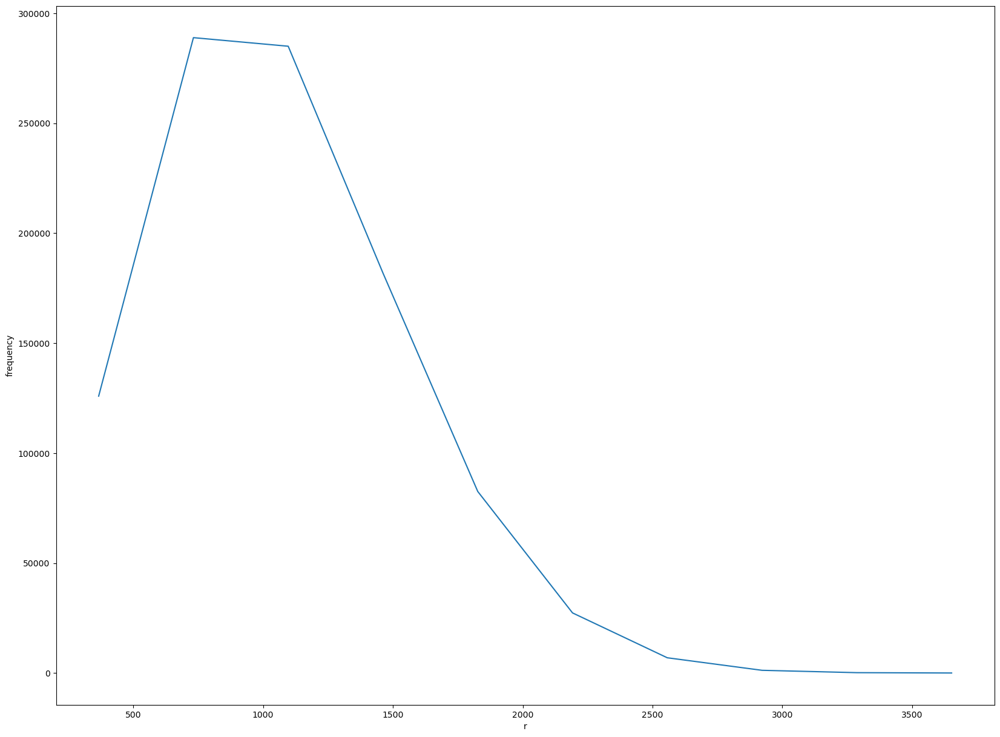

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import multiprocessing as mp
import os
N_cpu = os.cpu_count()
pool = mp.Pool(N_cpu-1)

def fourier_spectrum_distribution(k,list_theta,list_r,list_bins_theta,list_bins_r):
    print('processing index: ',k)    
    seed = k
    np.random.seed(seed)
    a_0alpha = (-1)**np.random.randint(1,3,1000000)
    x = np.linspace(0,1000000,1000000)
    fft_ =np.fft
    freq = np.complex64(fft_.fft(a_0alpha))
    r = [np.sqrt(a.imag**2 + a.real**2) for a in freq]
    theta = [np.arctan(a.imag/a.real) for a in freq]
    n_theta,bins_theta = np.histogram(theta)
    n_r,bins_r = np.histogram(r)
    return n_theta,n_r,bins_theta,bins_r
list_theta= [],list_r= [],list_bins_theta= [],list_bins_r = []
n_theta,n_r,bins_theta,bins_r = pool.map(fourier_spectrum_distribution,tuple(list(range(100),list_theta,list_r,list_bins_theta,list_bins_r)))

figtheta, axtheta = plt.subplots(1,1,figsize=(20,15))
figr, axr = plt.subplots(1,1,figsize=(20,15))
axr.plot(bins[1:],n)
axr.set_xlabel('r')
axr.set_ylabel('frequency')
axtheta.plot(bins[1:],n)
axtheta.set_xlabel('theta')
axtheta.set_ylabel('frequency')

figtheta.show()
figr.show()
'''
    My hypothesis is that different models with different dynamics will change the phases in the fourier transform of the time series, the distribution of the 
    amplitudes is something that remains invariant. This invariance is encoded in the way one build random models. Everything is related somehow to the
    structure of the operator space that drives the dynamics of the system.
'''

# IMAGINARY NUMBERS
## .imag is 1 order of magnitude faster than np.imag

In [44]:

import time
t0 = time.time()
for i in range(100000):
    (1+1j).real
t1 = time.time()
print('a.img',t1-t0)
t0 = time.time()
for i in range(100000):
    np.real(1+1j)
t1 = time.time()
print('np.img',t1-t0)


a.img 0.008077859878540039
np.img 0.026021957397460938


# DISTANCE MATRIX COMPUTATION
## Lesson: scipy distance is better than numpy distance [to return a distance matrix, but not by far]

In [8]:
import numpy as np
import scipy.spatial as sp
import time
x = np.random.rand(10000)
print(np.shape(x))
y = np.random.rand(10000)
X = np.array([x,y]).T
print('shape of X: ',X.shape)
t0 = time.time()
d = sp.distance_matrix(X,X)
t1 = time.time()
print('scipy distance: ',t1-t0)
t0 = time.time()
x2 = np.sum(X**2, axis=1) # shape of (m)
y2 = np.sum(X**2, axis=1) # shape of (n)
xy = np.matmul(X, X.T)
x2 = x2.reshape(-1, 1)
dists = np.sqrt(x2 - 2*xy + y2) # (m
t1 = time.time()
print('numpy distance: ',t1-t0)

(10000,)
shape of X:  (10000, 2)
scipy distance:  0.956500768661499
numpy distance:  1.1910429000854492


/tmp/ipykernel_3022/3403174643.py:18: RuntimeWarning: invalid value encountered in sqrt
  dists = np.sqrt(x2 - 2*xy + y2) # (m


In [31]:
x0 = X[0].reshape(1,len(X[0]))
x1 = X[1:]
print(x0.shape,x1.shape)
#d1 = np.ma.masked_array(d,mask = np.eye(len(d)))
d1 = sp.distance_matrix(x0,x1)
print('shape: ',d1.shape)
nd = np.unravel_index(np.argmin(d1, axis=None), d1.shape)
print('index of min: ',nd)
print(d)
print(d[nd[1],nd[0]])

(1, 2) (9999, 2)
shape:  (1, 9999)
index of min:  (0, 8689)
[[0.         0.78754323 0.51444816 ... 0.57504696 0.26337245 0.1888944 ]
 [0.78754323 0.         0.48285446 ... 0.60315603 0.67472423 0.80680621]
 [0.51444816 0.48285446 0.         ... 0.1384124  0.58631895 0.6428043 ]
 ...
 [0.57504696 0.60315603 0.1384124  ... 0.         0.69242895 0.72760683]
 [0.26337245 0.67472423 0.58631895 ... 0.69242895 0.         0.14837668]
 [0.1888944  0.80680621 0.6428043  ... 0.72760683 0.14837668 0.        ]]
0.4539722155398791


# NEWMAN 2D graph

52 53
53 7
7 52
53 26
26 7
7 53
2 53
53 52
52 2
91 21
21 24
24 91
39 5
5 74
74 39
75 62
62 37
37 75
63 30
30 78
78 63
97 70
70 7
7 97
83 97
97 7
7 83
31 21
21 91
91 31
5 64
64 80
80 5
64 5
5 39
39 64
50 64
64 39
39 50
64 45
45 80
80 64
64 50
50 45
45 64
76 5
5 80
80 76
76 48
48 74
74 76
62 18
18 37
37 62
2 89
89 53
53 2
53 89
89 26
26 53
89 58
58 26
26 89
30 55
55 78
78 30
55 30
30 38
38 55
42 22
22 44
44 42
22 55
55 38
38 22
55 22
22 78
78 55
22 11
11 78
78 22
11 22
22 42
42 11
66 47
47 62
62 66
60 62
62 75
75 60
60 66
66 62
62 60
60 75
75 80
80 60
45 60
60 80
80 45
30 81
81 38
38 30
81 30
30 63
63 81
70 81
81 63
63 70
22 46
46 44
44 22
0 83
83 7
7 0
31 49
49 21
21 31
5 77
77 74
74 5
77 76
76 74
74 77
76 77
77 5
5 76
92 75
75 37
37 92
76 92
92 48
48 76
75 92
92 80
80 75
92 76
76 80
80 92
18 69
69 37
37 18
48 69
69 87
87 48
92 69
69 48
48 92
69 92
92 37
37 69
8 89
89 2
2 8
89 8
8 58
58 89
82 34
34 28
28 82
34 51
51 28
28 34
51 16
16 28
28 51
71 2
2 52
52 71
50 14
14 45
45 50
14 11
11 4

TypeError: iteration over a 0-d array

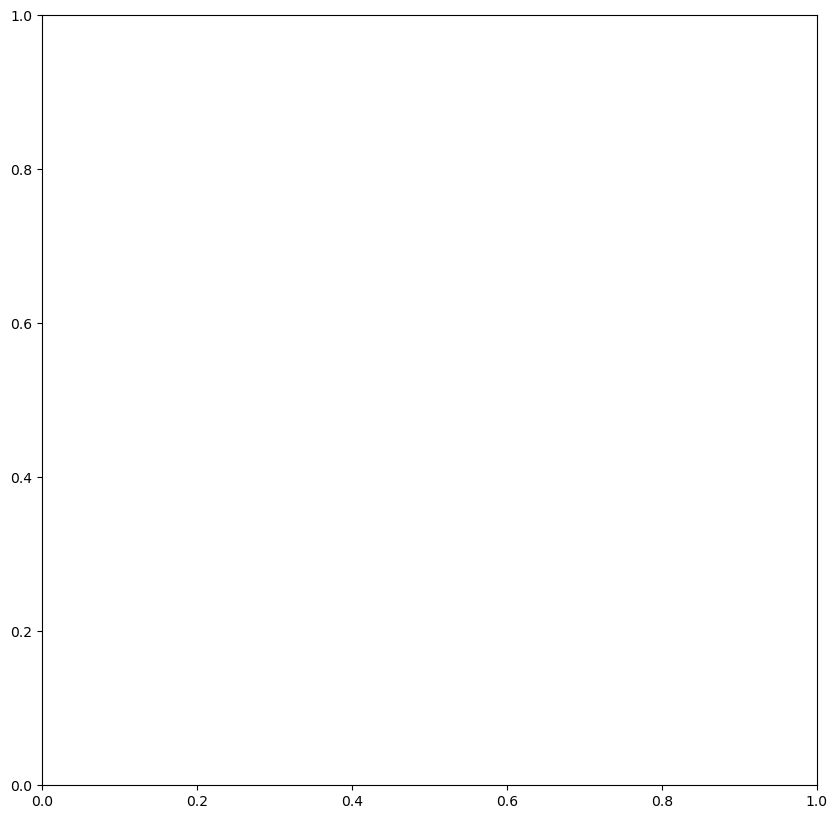

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import os

list_number_nodes = np.linspace(10,10000,100)
def generate_uniform_distribution_nodes_in_space_circle(radius_city,number_nodes):  
    '''
        Citation:
            The spatial structure of networks: Michael T. Gastner and M. E. J. Newman
        Description:
            Generate a uniform distribution of points in a circle of radius radius_city
            Initialize postiions and distance matrix
            ALL in one step:
    '''  
    from scipy.spatial import distance_matrix
    nodes_r = np.random.random(number_nodes)*radius_city
    i = np.random.randint(0,2,number_nodes)
    theta = np.random.random(number_nodes)*(2*np.pi)
#    nodes_costeta = 2*np.random.random(number_nodes) - 1 
    nodes_costeta = np.cos(theta)
    nodes_senteta = np.sin(theta)
    x = nodes_r*nodes_costeta
#    y = nodes_r*np.sqrt(1-nodes_costeta**2)*(-1)**i
    y = nodes_r*nodes_senteta
    d_m= distance_matrix(np.array([x,y]).T,np.array([x,y]).T)
    return x,y,d_m
def generate_uniform_distribution_nodes_in_space_square(side_city,number_nodes):
    '''
        Citation:
            The spatial structure of networks: Michael T. Gastner and M. E. J. Newman
        Description:
            Generate a uniform distribution of points in a circle of radius radius_city
            Initialize postiions and distance matrix
            ALL in one step:        
    '''
    from scipy.spatial import distance_matrix
    x = np.random.random(number_nodes)*side_city
    y = np.random.random(number_nodes)*side_city    
    d_m = distance_matrix(np.array([x,y]).T,np.array([x,y]).T)
    return x,y,d_m

def cost_function(distance_matrix,couple_indeces):
    mask = np.ma(distance_matrix,mask = couple_indeces)
    return np.sum(distance_matrix[mask])

def effective_length_edge(distance_matrix,i1,i2,lambda_):
    sqrt_n = np.sqrt(len(distance_matrix))
    return distance_matrix[i1,i2] + sqrt_n*lambda_*distance_matrix[i1,i2] + 1-lambda_

def delauney(points):
    from pyhull.delaunay import DelaunayTri
    tri = DelaunayTri(points)
    return tri
def area_triangle(T):
    A = T[:,0]
    B = T[:,1]
    C = T[:,2]
    return 0.5*np.sqrt(np.dot(np.cross(B-A,C-A),np.cross(B-A,C-A)))

def circumcenter(T):
    xv1 = T._coords[0]
    xv2 = T._coords[1]
    xv3 = T._coords[2]
    d = 2 * (xv1[0] * (xv2[1] - xv3[1]) + xv2[0] * (xv3[1] - xv1[1]) + xv3[0] * (xv1[1] - xv2[1]))
    ux = ((np.dot(xv1,xv1)) * (xv2[1] - xv3[1]) + (np.dot(xv2,xv2)) * (xv3[1] - xv1[1]) + (np.dot(xv3,xv3)) * (xv1[1] - xv2[1])) / d
    uy = ((np.dot(xv1,xv1)) * (xv3[0] - xv2[0]) + (np.dot(xv2,xv2)) * (xv3[0] - xv1[0]) + (np.dot(xv3,xv3)) * (xv2[0] - xv1[0])) / d
    r = np.sqrt((ux-xv1[0])**2 + (uy-xv1[1])**2)
    return np.array([ux,uy]),r


def density(points,area):
    return len(points)/area



def renormalization_scheme(square_idxx,square_idxy,side_square,side_city,number_nodes):
    '''
        Description:
            Generate a uniform distribution of points in a circle of radius radius_city
            Initialize postiions and distance matrix
            ALL in one step:        
    '''
    from scipy.spatial import distance_matrix
    x = np.random.random(number_nodes)*side_square
    y = np.random.random(number_nodes)*side_square    
    d_m = distance_matrix(np.array([x,y]).T,np.array([x,y]).T)
    return x,y,d_m


number_nodes = 100
side_city = 1
x,y,_ = generate_uniform_distribution_nodes_in_space_square(side_city,number_nodes)
from scipy.spatial import Delaunay
tri = Delaunay(np.array([x,y]).T)

# Find neighbors for each point
neighbors = [[] for _ in range(len(np.array([x,y]).T))]

# Iterate over all triangles in the Delaunay triangulation
for simplex in tri.simplices:
    for i, j in [(simplex[0], simplex[1]), (simplex[1], simplex[2]), (simplex[2], simplex[0])]:
        print(i,j)
        neighbors[i].append(j)
        neighbors[j].append(i)

# Print the neighbor list for each point
for i, point in enumerate(np.array([x,y]).T):
    print(f"Point {i} ({point}): Neighbors: {neighbors[i]}",np.array([x,y]).T[i])
#dl = delauney(np.array([x,y]).T)


# Get the neighbor list for each point
#neighbors = [dl.vertices[dl.vertex_neighbor_vertices[i:i+2]] for i in range(len(np.array([x,y]).T))]

# Print the neighbor list for each point
for i, point in enumerate(np.array([x,y]).T):
    print(f"Point {i} ({point}): Neighbors: {neighbors[i]}")

list_circles = []
list_phi = []
list_centers_x = []
list_centers_y = []
fig,ax = plt.subplots(1,1,figsize=(10,10))
#print('number triangles: ',len(dl))

for triangle in np.array(dl).T:
    print(triangle)
    center = findCircumCenter(triangle)
    r = np.sqrt(np.sum((triangle._coords[0]-center)**2))
    print(center)
    list_circles.append(center)
    list_centers_x.append(center[0])
    list_centers_y.append(center[1])
    At = area_triangle(triangle)
    list_phi.append(At/(2*np.pi*r**2))
    Drawing_uncolored_circle = plt.Circle( (center[0],center[1] ),r ,fill = False ) 
    ax.set_aspect( 1 )
    ax.add_artist( Drawing_uncolored_circle )
ax.triplot(np.array([x,y]).T[:,0],np.array([x,y]).T[:,1])
ax.scatter(np.array(list_centers_x),np.array(list_centers_y),color = 'r')
plt.show()
plt.hist(list_phi)

x,y,_ = generate_uniform_distribution_nodes_in_space_circle(side_city,number_nodes)
#delauney(np.array([x,y]).T)


In [2]:
def lineFromPoints(P, Q, a, b, c):
    a = Q[1] - P[1]
    b = P[0] - Q[0]
    c = a * (P[0]) + b * (P[1])
    return a, b, c
 
# Function which converts the input line to its
# perpendicular bisector. It also inputs the points
# whose mid-point lies on the bisector
def perpendicularBisectorFromLine(P, Q, a, b, c):
    mid_point = [(P[0] + Q[0])//2, (P[1] + Q[1])//2]
 
    # c = -bx + ay
    c = -b * (mid_point[0]) + a * (mid_point[1])
    temp = a
    a = -b
    b = temp
    return a, b, c
 
# Returns the intersection point of two lines
def lineLineIntersection(a1, b1, c1, a2, b2, c2):
    determinant = a1 * b2 - a2 * b1
    if (determinant == 0):
       
        # The lines are parallel. This is simplified
        # by returning a pair of (10.0)**19
        return [(10.0)**19, (10.0)**19]
    else:
        x = (b2 * c1 - b1 * c2)//determinant
        y = (a1 * c2 - a2 * c1)//determinant
        return [x, y]
 
def findCircumCenter(T):
    P = T[:,0]
    Q = T[:,1]
    R = T[:,2]
   
    # Line PQ is represented as ax + by = c
    a, b, c = 0.0, 0.0, 0.0
    a, b, c = lineFromPoints(P, Q, a, b, c)
 
    # Line QR is represented as ex + fy = g
    e, f, g = 0.0, 0.0, 0.0
    e, f, g = lineFromPoints(Q, R, e, f, g)
 
    # Converting lines PQ and QR to perpendicular
    # vbisectors. After this, L = ax + by = c
    # M = ex + fy = g
    a, b, c = perpendicularBisectorFromLine(P, Q, a, b, c)
    e, f, g = perpendicularBisectorFromLine(Q, R, e, f, g)
 
    # The point of intersection of L and M gives
    # the circumcenter
    circumcenter = lineLineIntersection(a, b, c, e, f, g)
 
    if (circumcenter[0] == (10.0)**19 and circumcenter[1] == (10.0)**19):
        print("The two perpendicular bisectors found come parallel")
        print("Thus, the given points do not form a triangle and are collinear")
    else:
        print("The circumcenter of the triangle PQR is: ", end="")
        print("(", circumcenter[0], ",", circumcenter[1], ")")
    return np.array(circumcenter)

# BARTHELEMY

In [14]:
from relativeNeighborhoodGraph import returnRNG

x,y,dm = generate_uniform_distribution_nodes_in_space_circle(side_city,number_nodes)
def compute_rng(graph_input, graph_output): 
    for i in graph_input.vertices():
        for j in graph_input.vertices(): 
            try:
                d_ij = graph_input[i][j]['weight']
            except KeyError:
                d_ij = None
                continue
            for x in graph_input.vertices(): 
                try:
                    d_ix = graph_input[i][x]['weight']
                except KeyError:
                    d_ix = None
                    continue
                try:
                    d_xj = graph_input[x][j]['weight']
                except KeyError:
                    d_xj = None
                    continue
                if max(d_ix, d_xj) < d_ij: break
            else:
                graph_output.add_edge(i,j, weight=d_ij)


AttributeError: module 'networkx' has no attribute 'from_numpy_matrix'

In [53]:
import numpy as np
from scipy.spatial import distance_matrix
starting_points = 3
added_points = 1
a = np.random.random((starting_points,2))
c = np.random.random((added_points,2))
def update_distance_matrix(old_points,new_point,dm):
    if not dm is None:
        dm_row = distance_matrix(new_point,old_points)
        dm_col = distance_matrix(old_points,new_point) # dimension (1,starting_points)
        dm_col = np.vstack((dm_col,[0]))
        dm_conc = np.concatenate((dm,dm_row),axis = 0) # dimension (starting_points+1,starting_popints)
        new_dm = np.concatenate((dm_conc,dm_col),axis = 1)
    else:
        dm = distance_matrix(old_points,old_points) # dimension (starting_points,starting_points)
        dm_col = distance_matrix(old_points,new_point) # dimension (1,starting_points)
        dm_col = np.vstack((dm_col,[0]))
        dm_conc = np.concatenate((dm,dm_row),axis = 0) # dimension (starting_points+1,starting_popints)
        new_dm = np.concatenate((dm_conc,dm_col),axis = 1)

update_distance_matrix(a,c,dm)


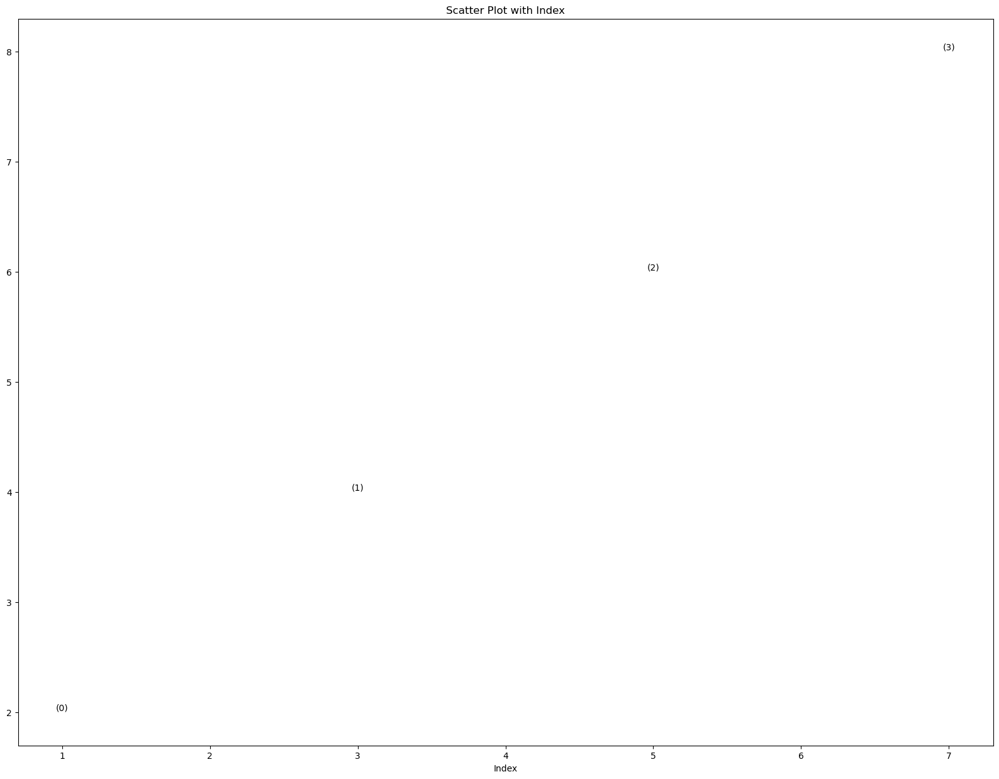

In [16]:
import matplotlib.pyplot as plt
def scatter_plot_with_index(x):
    fig,ax = plt.subplots(1,1,figsize=(20,15))
    n = len(x)
    indices = list(range(n))
    
    # Unzip the coordinates
    x_values, y_values = zip(*x)    
    ax.scatter(x_values, y_values, label='X Coordinate', color='white')
#    ax.scatter(indices, y_values, label='Y Coordinate', color='red')
    
    # Annotate each point with its index
    for i, (x_val, y_val) in enumerate(x):
        ax.text(x_val,y_val, f'({i})', verticalalignment='bottom', horizontalalignment='center', fontsize=10)
        
    # Set labels and title
    plt.xlabel('Index')
    plt.title('Scatter Plot with Index')
        
    # Show the plot
    plt.show()

# Example usage
vector_x = [(1, 2), (3, 4), (5, 6), (7, 8)]
scatter_plot_with_index(vector_x)


In [3]:
import pandas as pd
file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/BO/OD7.fma'
with open(file) as infile:
    for line in infile:
        print(line.split(' '))



['$OR;D2\n']
['*', 'From-Time', '', 'To-Time\n']
['7.00', '8.00\n']
['*', 'Factor\n']
['1.00\n']
['*\n']
['100', '100', '75.4732518011777\n']
['100', '100100', '0.748589204431928\n']
['100', '100200', '0.203420979465198\n']
['100', '100400', '0.764862882789144\n']
['100', '100500', '0.463799833180651\n']
['100', '100601', '0.15459994439355\n']
['100', '100603', '0.23596833617963\n']
['100', '100700', '0.23596833617963\n']
['100', '100800', '0.179010461929374\n']
['100', '100900', '0.117984168089815\n']
['100', '101001', '0.117984168089815\n']
['100', '101002', '0.260378853715453\n']
['100', '10103', '2.00979927711616\n']
['100', '10104', '1.89995194820495\n']
['100', '101102', '0.256310434126149\n']
['100', '10203', '1.48904156968525\n']
['100', '10204', '1.16763642213024\n']
['100', '10300', '0.614331357984898\n']
['100', '10405', '0.919462827182695\n']
['100', '10500', '0.284789371251277\n']
['100', '10600', '5.13027710211229\n']
['100', '10701', '0.634673455931418\n']
['100', '10702

In [7]:
import geopandas as gpd
path = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/BO/BOS.shp'
with fsspec.open(path) as file:
    df = gpd.read_file(file)


NameError: name 'fsspec' is not defined

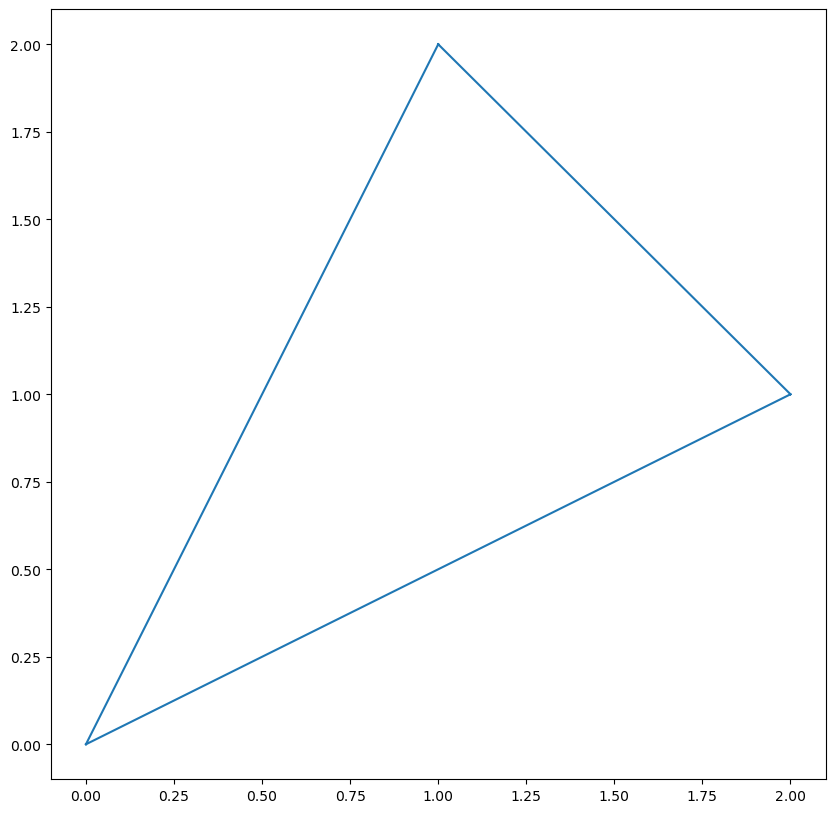

In [14]:
import matplotlib.pyplot as plt
import numpy as np
fig,ax = plt.subplots(1,1,figsize=(10,10))
x = [0,2,1]
y = [0,1,2]
from scipy.spatial import Delaunay
tri = Delaunay(np.array([x,y]).T)
print(tri)
ax.triplot(np.array([x,y]).T[:,0],np.array([x,y]).T[:,1])
